## Instructions
You are a marketing data analyst at a large bank. The bank’s marketing campaigns consists of calling customers on the phone to try to get them to make a term deposit. Your job is to predict which customers are more likely to subscribe a term deposit so that the bank can stop calling customers who are not likely to respond positively to the campaign.
The classification goal is to predict if the client will subscribe (yes/no) a term deposit (variable y).

## Download dataset
https://archive.ics.uci.edu/ml/datasets/Bank+Marketing
[Moro et al., 2014] S. Moro, P. Cortez and P. Rita. A Data-Driven Approach to Predict the Success of Bank Telemarketing. Decision Support Systems, In press, http://dx.doi.org/10.1016/j.dss.2014.03.001

## Deliverable
A short presentation of your analysis, key insights, and recommendations as to which customers the bank should target for its next campaign.

Input variables:
   # bank client data:
   1 - age (numeric)
   2 - job : type of job (categorical: "admin.","blue-collar","entrepreneur","housemaid","management","retired","self-employed","services","student","technician","unemployed","unknown")
   3 - marital : marital status (categorical: "divorced","married","single","unknown"; note: "divorced" means divorced or widowed)
   4 - education (categorical: "basic.4y","basic.6y","basic.9y","high.school","illiterate","professional.course","university.degree","unknown")
   5 - default: has credit in default? (categorical: "no","yes","unknown")
   6 - housing: has housing loan? (categorical: "no","yes","unknown")
   7 - loan: has personal loan? (categorical: "no","yes","unknown")
   # related with the last contact of the current campaign:
   8 - contact: contact communication type (categorical: "cellular","telephone") 
   9 - month: last contact month of year (categorical: "jan", "feb", "mar", ..., "nov", "dec")
  10 - day_of_week: last contact day of the week (categorical: "mon","tue","wed","thu","fri")
  11 - duration: last contact duration, in seconds (numeric). Important note:  this attribute highly affects the output target (e.g., if duration=0 then y="no"). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
   # other attributes:
  12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
  13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
  14 - previous: number of contacts performed before this campaign and for this client (numeric)
  15 - poutcome: outcome of the previous marketing campaign (categorical: "failure","nonexistent","success")
   # social and economic context attributes
  16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)
  17 - cons.price.idx: consumer price index - monthly indicator (numeric)     
  18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)     
  19 - euribor3m: euribor 3 month rate - daily indicator (numeric)
  20 - nr.employed: number of employees - quarterly indicator (numeric)

Output variable (desired target):
  21 - y - has the client subscribed a term deposit? (binary: "yes","no")
'''

In [508]:
#Import libraries
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import researchpy
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.feature_selection import mutual_info_classif
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV

In [509]:
df = pd.read_csv('bank-additional-full.csv', header = 0, delimiter =';')

In [510]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [511]:
df.info()
df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
age               41188 non-null int64
job               41188 non-null object
marital           41188 non-null object
education         41188 non-null object
default           41188 non-null object
housing           41188 non-null object
loan              41188 non-null object
contact           41188 non-null object
month             41188 non-null object
day_of_week       41188 non-null object
duration          41188 non-null int64
campaign          41188 non-null int64
pdays             41188 non-null int64
previous          41188 non-null int64
poutcome          41188 non-null object
emp.var.rate      41188 non-null float64
cons.price.idx    41188 non-null float64
cons.conf.idx     41188 non-null float64
euribor3m         41188 non-null float64
nr.employed       41188 non-null float64
y                 41188 non-null object
dtypes: float64(5), int64(5), object(11)
memory usa

(41188, 21)

In [512]:
df.isnull().values.any() # no missing values

False

In [513]:
#df.duplicated().sum() # no duplication
print(df[df.duplicated()])
duplicated = df.drop_duplicates(inplace = True) # Remove duplicated row
print(duplicated)

       age          job   marital            education  default housing loan  \
1266    39  blue-collar   married             basic.6y       no      no   no   
12261   36      retired   married              unknown       no      no   no   
14234   27   technician    single  professional.course       no      no   no   
16956   47   technician  divorced          high.school       no     yes   no   
18465   32   technician    single  professional.course       no     yes   no   
20216   55     services   married          high.school  unknown      no   no   
20534   41   technician   married  professional.course       no     yes   no   
25217   39       admin.   married    university.degree       no      no   no   
28477   24     services    single          high.school       no     yes   no   
32516   35       admin.   married    university.degree       no     yes   no   
36951   45       admin.   married    university.degree       no      no   no   
38281   71      retired    single    uni

In [514]:
(df.loan == 'unknown').sum() # 990 unknown items
#(df['marital'] == 'unknown').sum() # 80 unknown items

990

In [515]:
df.poutcome.value_counts()

nonexistent    35551
failure         4252
success         1373
Name: poutcome, dtype: int64

In [516]:
p_outcome_convert_crosstab = pd.crosstab(df.poutcome, df.y, margins = False) 
p_outcome_convert_crosstab
# to determine if customers who had responded previously successfully were more likely to convert, is not by random chance

y,no,yes
poutcome,,
failure,3647,605
nonexistent,32411,3140
success,479,894


In [517]:
from scipy.stats import chi2_contingency

chi2, pval, dof, expected = chi2_contingency(p_outcome_convert_crosstab)
print(f'''
chi2: {chi2}
pval: {pval}
dof: {dof}
expected: {expected}
''')


chi2: 4230.14342770359
pval: 0.0
dof: 2
expected: [[ 3772.958   479.042]
 [31545.728  4005.272]
 [ 1218.314   154.686]]



In [518]:
import researchpy # Alternative by using another library 
crosstab, res, expected = researchpy.crosstab(df['poutcome'], df['y'], test= "chi-square", expected_freqs= True)
print(crosstab)
print(res)
print(expected)

                 y             
                no   yes    All
poutcome                       
failure       3647   605   4252
nonexistent  32411  3140  35551
success        479   894   1373
All          36537  4639  41176
                Chi-square test    results
0  Pearson Chi-square ( 2.0) =   4230.1434
1                    p-value =      0.0000
2                 Cramer's V =      0.3205
                        y             
                       no          yes
poutcome                              
failure       3772.958131   479.041869
nonexistent  31545.727778  4005.272222
success       1218.314091   154.685909


Since p_value < 0.05, there is statiscally significant association between poutcome and y.

In [519]:
#outcome of the previous marketing campaign - response rate
benchmark_rate = 4640/41188
# y = yes when poutcome = success
response_rate_by_success = 894/1373
# y = yes when poutcome = failure
response_rate_by_failure = 605/4252 
# y = yes when poutcome = non-existent
response_rate_by_nonexistent = 3141/35563

print(f'''
1) If the customer had responded successfully to a previous marketing campaign, the converted rate: {response_rate_by_success}
2) If the customer had failure to respond to a previous marketing campaign, the converted rate: {response_rate_by_failure}
3) Others: the converted rate: {response_rate_by_nonexistent}
''')



1) If the customer had responded successfully to a previous marketing campaign, the converted rate: 0.651128914785142
2) If the customer had failure to respond to a previous marketing campaign, the converted rate: 0.1422859830667921
3) Others: the converted rate: 0.08832213255349661



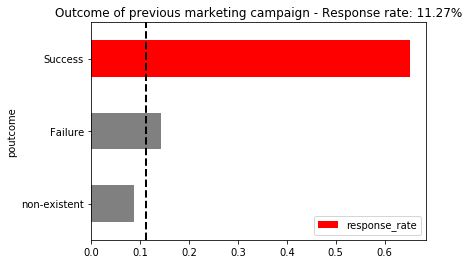

In [520]:
response_rate = [response_rate_by_success,response_rate_by_failure, response_rate_by_nonexistent]
p_outcome = ['Success', 'Failure', 'non-existent']
bar_chart = pd.DataFrame({'poutcome': p_outcome, 'response_rate': response_rate})
ax = bar_chart.plot.barh(x='poutcome', y='response_rate', color=(bar_chart['response_rate'] > 0.5).map({True: 'red', False: 'grey'}))
plt.gca().invert_yaxis()
plt.axvline(benchmark_rate, color='black', linestyle='dashed', linewidth=2, label="benchmark")
plt.title('Outcome of previous marketing campaign - Response rate: ' + str(round((benchmark_rate*100),2)) + '%')
plt.show()

# Conclusion
If customers who had responded previously successfully, they are more likely to convert and should be contacted for their marketing campaigns.

# Purpose
- increase campaign efficiency by identifying the main characteristics that affect success, helping in a better management of the available resources (e.g. human effort, phone calls, time) and selection of a high quality and affordable set of potential buying customers.

# Correlation of variables against term_deposit
# Visualize data to prove the corr
# Random Forest for Machine learning (Select the meaningful variables)
# RFM Analysis for Customer Segmentation
https://www.kaggle.com/tklimonova/online-retail-cohort-and-rfm-analysis/

Input variables:
# Numeric
1. age
12 - campaign
13 - pdays
14 - previous
   # social and economic context attributes
  16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)
  17 - cons.price.idx: consumer price index - monthly indicator (numeric)     
  18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)     
  19 - euribor3m: euribor 3 month rate - daily indicator (numeric)
  20 - nr.employed: number of employees - quarterly indicator (numeric)

# Ordinal
4 - education (+unknown)
9 - month
10 - day_of_week
# Nominal
2 - job (+unknown)
3 - marital(+unknown)
5 - default (+unknown)
6 - housing (+unknown)
7 - loan (+unknown)
#8 - contact (2 cat)
15 - poutcome
# related with the last contact of the current campaign:
# Exception  
  11 - duration: last contact duration, in seconds (numeric). Important note:  this attribute highly affects the output target (e.g., if duration=0 then y="no"). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
   

# Output variable (desired target):
  21 - y - has the client subscribed a term deposit? (binary: "yes","no")

Rule of Thumb for Interpreting the Size of a Correlation Coefficient4

Size of Correlation	Interpretation
.90 to 1.00 (−.90 to −1.00)	Very high positive (negative) correlation
.70 to .90 (−.70 to −.90)	High positive (negative) correlation
.50 to .70 (−.50 to −.70)	Moderate positive (negative) correlation
.30 to .50 (−.30 to −.50)	Low positive (negative) correlation
.00 to .30 (.00 to −.30)	negligible correlation

# Data Understanding phase (rattle tool)
Which attributes could influence the target


In [521]:
df['term_deposit'] = df['y'].map({'yes':1, 'no':0})
# Correlation between binary and continuous variables
from scipy import stats
#https://towardsdatascience.com/point-biserial-correlation-with-python-f7cd591bd3b1
# point biserial correlation
# Assumptions about data regarding normality and homoscedasticity
variables = list(df.loc[:, df.dtypes == float].columns)
for variable in variables:
    X = stats.pointbiserialr(df[variable], df.term_deposit)
    print(f'''{variable}
    {X}''')

#corr = df.corr()

'''
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)'''

emp.var.rate
    PointbiserialrResult(correlation=-0.29828850424620623, pvalue=0.0)
cons.price.idx
    PointbiserialrResult(correlation=-0.13613397100783473, pvalue=1.6222328682887585e-169)
cons.conf.idx
    PointbiserialrResult(correlation=0.05480181650949933, pvalue=9.132175775142023e-29)
euribor3m
    PointbiserialrResult(correlation=-0.30774039558468924, pvalue=0.0)
nr.employed
    PointbiserialrResult(correlation=-0.354669015382673, pvalue=0.0)


"\nax = sns.heatmap(\n    corr, \n    vmin=-1, vmax=1, center=0,\n    cmap=sns.diverging_palette(20, 220, n=200),\n    square=True\n)\nax.set_xticklabels(\n    ax.get_xticklabels(),\n    rotation=45,\n    horizontalalignment='right'\n)"

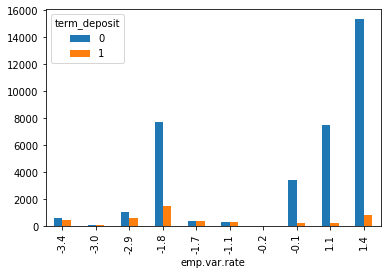

In [522]:
# employment variation rate - quarterly indicator (numeric)
emp_rate = df.groupby(['emp.var.rate','term_deposit'])['term_deposit'].count()
emp_rate.unstack().plot(kind="bar", stacked=False) 

Text(0.5, 1.0, 'previous')

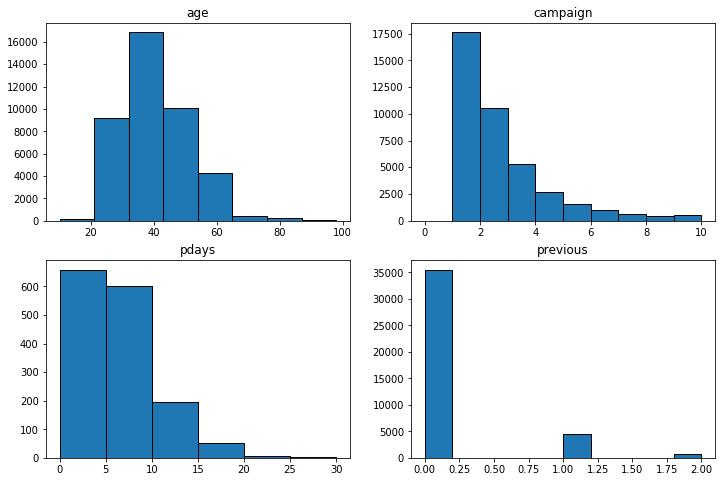

In [523]:
# age distribution
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(2,2,1)
age = df.age.values
plt.hist(age, range=(10, 98), bins=8,  edgecolor="black")
plt.title('age')

# number of contacts performed during this campaign and for this client (numeric, includes last contact)
ax2 = fig.add_subplot(2,2,2)
campaign = df.campaign.values 
plt.hist(campaign, range=(0, 10), bins=10,  edgecolor="black") # range(1,56)
plt.title('campaign')

# number of days that passed by after the client was last contacted from a previous campaign
ax3 = fig.add_subplot(2,2,3)
pdays = df.pdays.values
plt.hist(pdays, range=(0, 30), bins=6, edgecolor="black") # range(0,999)
plt.title('pdays')

# number of contacts performed before this campaign and for this client (numeric)
ax4 = fig.add_subplot(2,2,4)
previous = df.previous.values
plt.hist(previous,range=(0, 2), edgecolor="black") # range(0,7)
plt.title('previous')

#Not following normalization

In [524]:
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,term_deposit
count,41176.00000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000
mean,40.02380,258.315815,2.567879,962.464810,0.173013,0.081922,93.575720,-40.502863,3.621293,5167.034870,0.112663
std,10.42068,259.305321,2.770318,186.937102,0.494964,1.570883,0.578839,4.627860,1.734437,72.251364,0.316184
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000,0.000000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000,0.000000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000,0.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000,0.000000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000,1.000000


Text(0.5, 1.0, 'nr.employed')

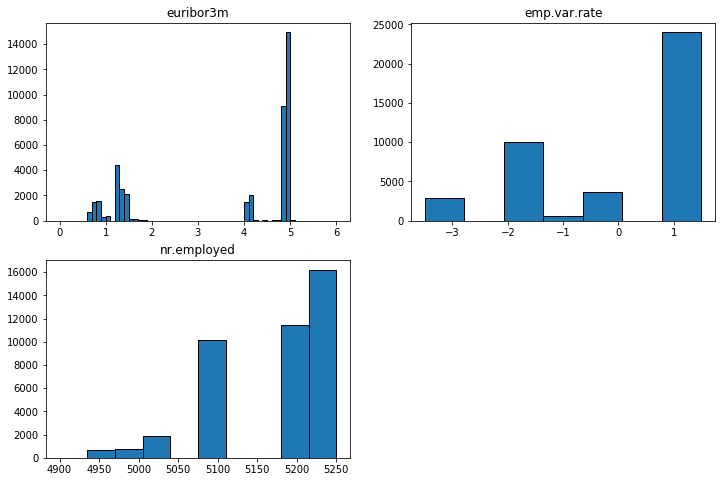

In [525]:
# euribor3m distribution
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(2,2,1)
euribor3m = df.euribor3m.values
plt.hist(euribor3m, range=(0, 6), bins=60,  edgecolor="black")
plt.title('euribor3m')

# employment variation rate - quarterly indicator 
ax2 = fig.add_subplot(2,2,2)
emp_rate = df['emp.var.rate'].values 
plt.hist(emp_rate, range=(-3.5, 1.5), bins=7,  edgecolor="black") 
plt.title('emp.var.rate')

# number of employees - quarterly indicator 
ax3 = fig.add_subplot(2,2,3)
nr_employed = df['nr.employed'].values
plt.hist(nr_employed, range=(4900, 5250), bins=10, edgecolor="black") 
plt.title('nr.employed')

#Not following normalization

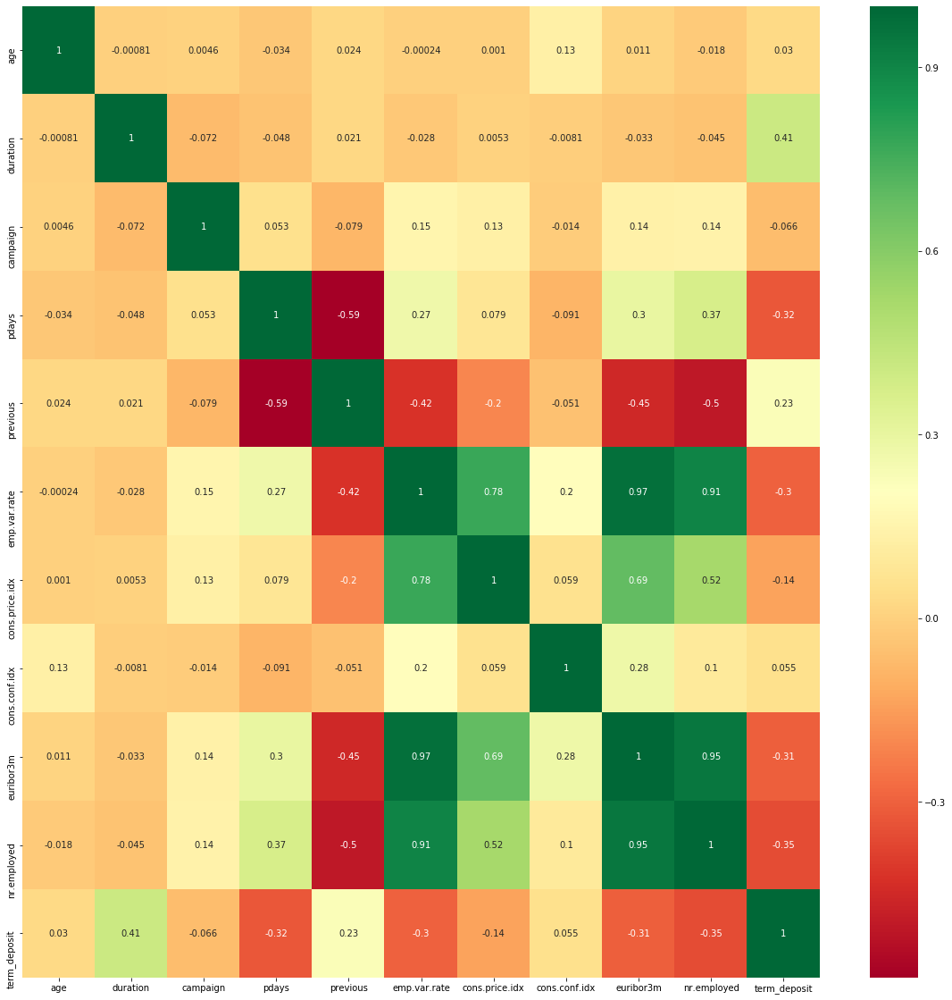

In [526]:
#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [527]:
cut_labels_6 = ['<=20', '21-30', '31-40', '41-50', '51-60', '>60'] # check > 51 later
cut_bins = [0, 20, 30, 40, 50, 60, 100]
df['age_group'] = pd.cut(df['age'], bins=cut_bins, labels=cut_labels_6)

In [528]:
variables = ['age_group'] + list(df.loc[:, df.dtypes == object].columns) # choose all variables of category/ string types
category_list = []
for i in variables:
    category_list.append(variables.index(i))
    print(f"{i}:  {str((df[i] == 'unknown').sum())}")

print(990/41176) # 2% data can be removed
print(category_list)
print(category_list[:-1])

age_group:  0
job:  330
marital:  80
education:  1730
default:  8596
housing:  990
loan:  990
contact:  0
month:  0
day_of_week:  0
poutcome:  0
y:  0
0.024043131921507675
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [529]:
# Select variables of numeric types
category_list = ['age_group'] + list(df.select_dtypes(include=['object']).columns)
print(category_list)

numerical_list = list(df.select_dtypes(include=['int64', 'float64']).columns)
print(numerical_list[2:-1])
df[category_list].columns
df[numerical_list[2:-1]].columns

['age_group', 'job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'y']
['campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']


Index(['campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed'],
      dtype='object')

In [530]:
X = df[category_list[:-1] + numerical_list[2:-1]]
print(X.columns)
y = df['term_deposit']
print(category_list[:3])
print(category_list[4:-1])
category_list.remove('education')
category_list[0:-1]

Index(['age_group', 'job', 'marital', 'education', 'default', 'housing',
       'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'campaign',
       'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
       'euribor3m', 'nr.employed'],
      dtype='object')
['age_group', 'job', 'marital']
['default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome']


['age_group',
 'job',
 'marital',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'day_of_week',
 'poutcome']

CPU times: user 4 µs, sys: 3 µs, total: 7 µs
Wall time: 14.1 µs
Train:  (32940, 19) (32940,)
Test:  (8236, 19) (8236,)
Accuracy: 88.83
0.8882952889752307
Feature 0: 69.535776
Feature 1: 62.391434
Feature 2: 23.059078
Feature 3: 242.737081
Feature 4: 3.960880
Feature 5: 2.061562
Feature 6: 427.708574
Feature 7: 0.033311
Feature 8: 5.893079
Feature 9: 83.236646
Feature 10: 28.341106
Feature 11: 12.814056
Feature 12: 125.968728
Feature 13: 343.655301
Feature 14: 432.723389
Feature 15: 57.312553
Feature 16: 9.861186
Feature 17: 713.150823
Feature 18: 406.394294
[17 14  6 18 13  3 12  9  0  1 15 10  2 11 16  8  4  5  7]
['euribor3m', 'emp.var.rate', 'loan', 'nr.employed', 'previous', 'education', 'pdays', 'day_of_week', 'age_group', 'job', 'cons.price.idx', 'poutcome', 'marital', 'campaign', 'cons.conf.idx', 'month', 'default', 'housing', 'contact']


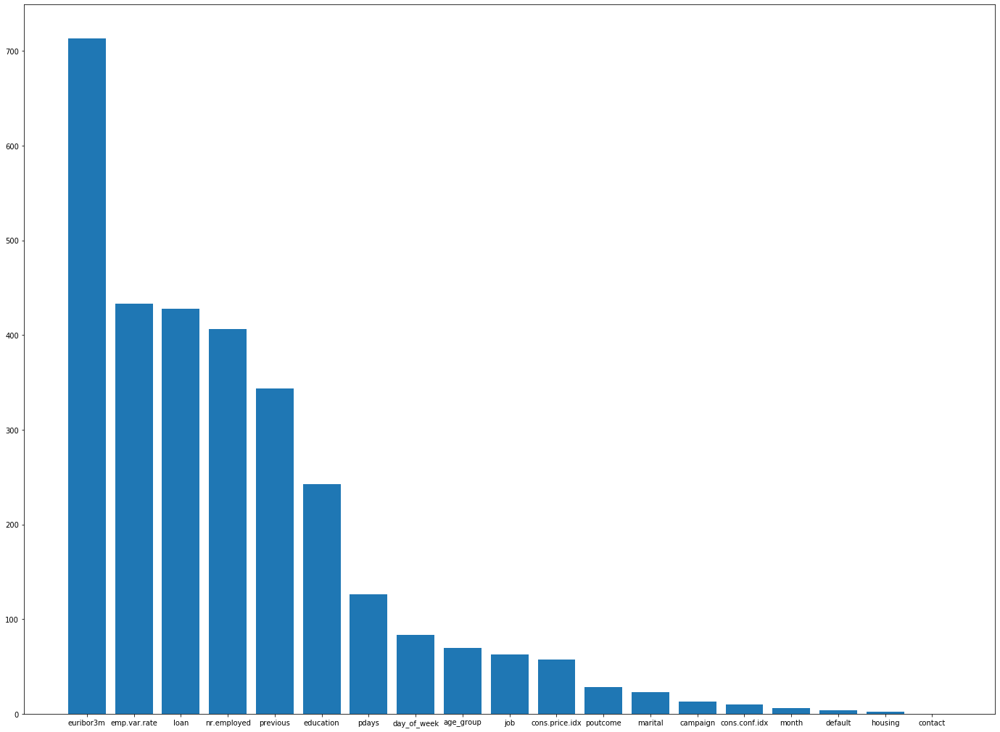

In [588]:
# prepare input data

%time

t = [('cat', OrdinalEncoder(), category_list[:-1]),\
     ('edu', OrdinalEncoder(categories=[["illiterate", "unknown", "basic.4y","basic.6y","basic.9y","high.school","professional.course","university.degree"]]), ['education']),\
     ('num', MinMaxScaler(), numerical_list[2:-1])]
col_transform = ColumnTransformer(transformers=t, n_jobs=-1)

fs = SelectKBest(score_func=sklearn.feature_selection.chi2, k=3)

# fit the Logistic Regression model
#model = LogisticRegression(solver='lbfgs')
#model = RandomForestClassifier(n_estimators# = 100, random_state = 42)
model = DecisionTreeClassifier(random_state = 42, max_depth = 11)


steps=[('preprocessing',col_transform),('feature_selection', fs), ('classifier', model)]
#print(steps)
pipeline = Pipeline(steps)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

print('Train: ', X_train.shape, y_train.shape)
print('Test: ', X_test.shape, y_test.shape)

'''
search_space = [{'feature_selection__k': [5, 6, 7, 8]},
                {'classifier': [LogisticRegression(solver='lbfgs')]},
                {'classifier': [RandomForestClassifier(n_estimators=100, random_state = 42)],
                 'classifier__n_estimators': [50, 100, 150]},
                {'classifier': [DecisionTreeClassifier(random_state = 42)],
                 'classifier__max_depth': [10, 11, 12]}]

clf = GridSearchCV(pipeline, search_space, cv=10, verbose=0)
clf = clf.fit(X_train, y_train)
yhat = clf.predict(X_test)
# evaluate proba
phat = clf.predict_proba(X_test)
accuracy = accuracy_score(y_test, yhat)
print('Accuracy: %.2f' % (accuracy*100))

clf.best_estimator_
clf.best_score_
'''
pipeline.fit(X_train, y_train)
# evaluate predictions

yhat = pipeline.predict(X_test)
# evaluate proba
phat = pipeline.predict_proba(X_test)


accuracy = accuracy_score(y_test, yhat)
print('Accuracy: %.2f' % (accuracy*100))

print(pipeline.score(X_test, y_test))

for i in range(len(fs.scores_)):
    print('Feature %d: %f' % (i, fs.scores_[i]))


# Sort feature importance by descending order
indices = np.argsort(fs.scores_)[::-1]
print(indices)
feature_list = list(X_train.columns.values[indices[0:len(fs.scores_)]])
print(feature_list)

# plot the scores
plt.figure(figsize = (24,18))
plt.bar(feature_list, fs.scores_[indices])
plt.show()


No Skill: ROC AUC=0.500
Logistic: ROC AUC=0.756


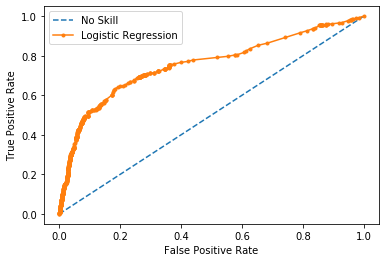

In [533]:
#Reference: https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/#:~:text=ROC%20Curves%20and%20AUC%20in%20Python,-We%20can%20plot&text=The%20AUC%20for%20the%20ROC,probabilities%20for%20the%201%20class.
def roc_auc_graph(model,phat, y_test_enc, label_name):
    # generate a no skill prediction (majority class)
    ns_probs = [0 for _ in range(len(y_test_enc))]
    lr_probs = phat
    #model.predict_proba(X_test_fs)
    # keep probabilities for the positive outcome only
    lr_probs = lr_probs[:, 1]
    # calculate scores
    ns_auc = roc_auc_score(y_test_enc, ns_probs)
    lr_auc = roc_auc_score(y_test_enc, lr_probs)
    # summarize scores
    print('No Skill: ROC AUC=%.3f' % (ns_auc))
    print('Logistic: ROC AUC=%.3f' % (lr_auc))
    # calculate roc curves
    ns_fpr, ns_tpr, _ = roc_curve(y_test_enc, ns_probs)
    lr_fpr, lr_tpr, _ = roc_curve(y_test_enc, lr_probs)
    # plot the roc curve for the model
    plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
    plt.plot(lr_fpr, lr_tpr, marker='.', label=label_name)
    # axis labels
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    # show the legend
    plt.legend()
    # show the plot
    plt.show()

roc_auc_graph(model,phat, y_test,'Logistic Regression')
#roc_auc_graph(model,phat, y_test,'Random Forest')
#roc_auc_graph(model,phat, y_test,'Decision Tree')

In [534]:
print('Classification report:\n\n{}'.format(classification_report(y_test, yhat)))

Classification report:

              precision    recall  f1-score   support

           0       0.89      0.98      0.94      7265
           1       0.54      0.13      0.21       971

    accuracy                           0.88      8236
   macro avg       0.72      0.56      0.58      8236
weighted avg       0.85      0.88      0.85      8236



In [535]:
print(y_test_enc)
print(phat)
splitted = list(zip(*(filter(lambda t: t[0] == 1, zip(y_test_enc, phat)))))

filtered_y_test_enc = splitted[0]
filtered_phat = splitted[1]

[1 0 1 ... 0 0 0]
[[0.723 0.277]
 [0.836 0.164]
 [0.443 0.557]
 ...
 [0.975 0.025]
 [0.951 0.049]
 [0.975 0.025]]


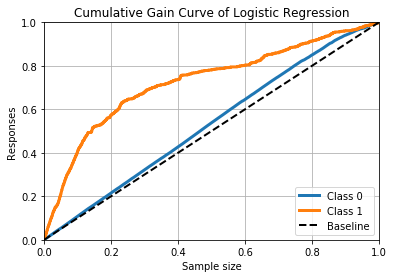

In [536]:
import scikitplot as skplt

def plot_cumulative_gain_graph(y_test, phat, title_name):
    skplt.metrics.plot_cumulative_gain(y_test, phat, title = title_name)
    plt.xlabel('Sample size')
    plt.ylabel('Responses')
    plt.show()

plot_cumulative_gain_graph(y_test, phat, 'Cumulative Gain Curve of Logistic Regression')
#plot_cumulative_gain_graph(y_test, phat, 'Cumulative Gain Curve of Random Forest')
#plot_cumulative_gain_graph(y_test, phat, 'Cumulative Gain Curve of Decision Tree')

# To-do list
- tidy up the code (incuding graph of understanding the data)

def print_tree(node, spacing=""):
    """World's most elegant tree printing function."""
    question_dict = {0: "Buying Price", 1:"Price of maintenance", 2:"Number of doors", 3:"Person Capacity", 4:"Size of luggage boot", 5:"Estimated Saftey"}
    # Base case: we've reached a leaf
    if isinstance(node, Leaf):
        print (spacing + str(node.labels))
        return

    # Print the question at this node
    print (spacing + "Splitting on " + question_dict[node.feature])

    # Call this function recursively on the true branch
    for i in range(len(node.branches)):
        print (spacing + '--> Branch ' + node.branches[i].value+':')
        print_tree(node.branches[i], spacing + "  ")

subset_tree=build_tree(data_subset, labels_subset)
print_tree(subset_tree)

In [592]:
feature_ids = fs.get_support(indices=True)
print(feature_ids)
feature_list = list(X_train.columns.values[feature_ids[0:len(feature_ids)]])
print(feature_list)

[17 14  6 18 13  3 12  9  0  1 15 10  2 11 16  8  4  5  7]
[ 6 14 17]
['loan', 'emp.var.rate', 'euribor3m']


In [593]:
#Refernce link: https://www.kaggle.com/willkoehrsen/visualize-a-decision-tree-w-python-scikit-learn
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(model, out_file='tree.dot', 
                feature_names = feature_list,
                class_names = ['No','Yes'],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')